## **Multi-Disease Classification System Using Gene Expression Biomarkers: Integrating Preeclampsia, SLE, Hypertension, and Hypothyroidism Prediction**

This project implements a comprehensive machine learning pipeline for the integrated classification of four distinct diseases (Preeclampsia, Systemic Lupus Erythematosus, Hypertension, and Hypothyroidism) using gene expression biomarkers. The system combines multiple RNA-seq datasets, employs advanced feature selection methods, and utilizes ensemble learning techniques to achieve robust multi-class disease prediction.

### **1. Import Libraries**
Description: Import necessary Python libraries for data analysis and machine learning:
- **pandas & numpy**: Core data manipulation and numerical computation
- **seaborn & matplotlib**: Data visualization 
- **sklearn**: Machine learning algorithms, preprocessing, and evaluation metrics
- **xgboost & lightgbm**: Gradient boosting frameworks
- **imblearn**: Class imbalance handling tools
- **joblib**: Model persistence utilities

In [1]:
# Import necessary libraries
import joblib
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import StackingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LassoCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc
from tqdm.notebook import tqdm

### **2. Define Data Paths**
Description: Centralize file paths for gene expression data and metadata across multiple diseases:
- **Preeclampsia (PE)**: Two datasets (GSE148241, GSE172381)
- **Systemic Lupus Erythematosus (SLE)**: Two datasets (GSE109843, GSE110999) 
- **Hypertension (HPT)**: Single dataset (GSE120852)
- **Hypothyroidism (HPTh)**: Single dataset (GSE147527)

In [2]:
data_paths = {
    "pe_counts": ["Data for ML_PE/Preeclampsia/GSE148241_counts_data.csv", "Data for ML_PE/Preeclampsia/GSE172381_counts_data.csv"],
    "pe_metadata": ["Data for ML_PE/Preeclampsia/GSE148241_metadata.csv", "Data for ML_PE/Preeclampsia/GSE172381_metadata.csv"],
    "hpt_counts": "Data for ML_PE/Hypertension/GSE120852_counts_data.csv",
    "hpt_metadata": "Data for ML_PE/Hypertension/GSE120852_metadata.csv",
    "hpth_counts": "Data for ML_PE/Hypothyroidism/GSE147527_counts_data.csv",
    "hpth_metadata": "Data for ML_PE/Hypothyroidism/GSE147527_metadata.csv",
    "sle_counts": ["Data for ML_PE/SLE/GSE109843_counts_data.csv", "Data for ML_PE/SLE/GSE110999_counts_data.csv"],
    "sle_metadata": ["Data for ML_PE/SLE/GSE109843_metadata.csv", "Data for ML_PE/SLE/GSE110999_metadata.csv"]
}

### **3. Load and Merge Datasets**
Description: Process and combine multiple gene expression datasets:
1. Load individual datasets from CSV files
2. Merge related datasets (PE and SLE have two datasets each)
3. Standardize data format across all diseases
4. Handle metadata separately for proper labeling

In [3]:
# Load and merge PE datasets
pe_counts_0 = pd.read_csv(data_paths["pe_counts"][0], index_col=0)
pe_counts_1 = pd.read_csv(data_paths["pe_counts"][1], index_col=0)
pe_metadata_0 = pd.read_csv(data_paths["pe_metadata"][0])
pe_metadata_1 = pd.read_csv(data_paths["pe_metadata"][1])

pe_counts = pd.concat([pe_counts_0, pe_counts_1], axis=1)
pe_metadata = pd.concat([pe_metadata_0, pe_metadata_1], axis=0)

In [4]:
# Load and merge SLE dataset
sle_counts_0 = pd.read_csv(data_paths["sle_counts"][0], index_col=0)
sle_counts_1 = pd.read_csv(data_paths["sle_counts"][1], index_col=0)
sle_metadata_0 = pd.read_csv(data_paths["sle_metadata"][0])
sle_metadata_1 = pd.read_csv(data_paths["sle_metadata"][1])
sle_counts = pd.concat([sle_counts_0, sle_counts_1], axis=1)
sle_metadata = pd.concat([sle_metadata_0, sle_metadata_1], axis=0)

In [5]:
# Load HPT dataset
hpt_counts = pd.read_csv(data_paths["hpt_counts"], index_col=0)
hpt_metadata = pd.read_csv(data_paths["hpt_metadata"])

# Load HPTh dataset
hpth_counts = pd.read_csv(data_paths["hpth_counts"], index_col=0)
hpth_metadata = pd.read_csv(data_paths["hpth_metadata"])

### **4. Label Metadata**
Description: Create binary disease state labels for each condition:
1. **Preeclampsia (PE)**:
   - Label 1: Case (PE present)
   - Label 0: Control (healthy)
2. **Hypertension (HPT)**:
   - Label 2: Case (HPT present)
   - Label 0: Control (healthy)
3. **Hypothyroidism (HPTh)**:
   - Label 3: Case (HPTh present)
   - Label 0: Control (healthy)
4. **SLE**:
   - Label 4: Case (SLE present)
   - Label 0: Control (healthy)

Process:
- Use lambda functions to transform "Condition" column
- Create new "label" column in each metadata DataFrame

In [6]:
# Label all metadata
pe_metadata["label"] = pe_metadata["Condition"].apply(
    lambda x: 1 if x == "Case" else 0
)
hpt_metadata["label"] = hpt_metadata["Condition"].apply(
    lambda x: 2 if x == "Case" else 0
)
hpth_metadata["label"] = hpth_metadata["Condition"].apply(
    lambda x: 3 if x == "Case" else 0
)
sle_metadata["label"] = sle_metadata["Condition"].apply(
    lambda x: 4 if x == "Case" else 0
)

### **5. Preprocess Counts Data**
Description: Transform gene expression count data for ML analysis:
1. **Data Organization**:
   - Set gene symbols as DataFrame index
   - Transpose matrix (samples as rows, genes as columns)
   - Name index 'GSM' for sample IDs
2. **Label Integration**:
   - Add disease labels from metadata
   - Ensure column names are strings
3. **Applied to**:
   - PE counts data
   - SLE counts data
   - HPT counts data
   - HPTh counts data

In [7]:
# Preprocess PE data
pe_counts = pe_counts.set_index('gene_symbol').T
pe_counts.index.name = 'GSM'
pe_counts['label'] = pe_metadata['label'].values
pe_counts.columns = [col if isinstance(col, str) else col[0] for col in pe_counts.columns]

In [8]:
# Preprocess SLE data
sle_counts = sle_counts.set_index('gene_symbol').T
sle_counts.index.name = 'GSM'
sle_counts['label'] = sle_metadata['label'].values
sle_counts.columns = [col if isinstance(col, str) else col[0] for col in sle_counts.columns]

In [9]:
# Preprocess HPT data
hpt_counts = hpt_counts.set_index('gene_symbol').T
hpt_counts.index.name = 'GSM'
hpt_counts['label'] = hpt_metadata['label'].values
hpt_counts.columns = [col if isinstance(col, str) else col[0] for col in hpt_counts.columns]


In [10]:
# Preprocess HPTh data
hpth_counts = hpth_counts.set_index('gene_symbol').T
hpth_counts.index.name = 'GSM'
hpth_counts['label'] = hpth_metadata['label'].values
hpth_counts.columns = [col if isinstance(col, str) else col[0] for col in hpth_counts.columns]

### **6. Quality Control**
Description: Implement data quality checks and cleanup:
1. **Missing Values Check**:
   - Identify columns with null values
   - Quantify extent of missing data
   - Report affected features
2. **Duplicate Detection**:
   - Find duplicate rows/samples
   - Count duplicates per dataset
3. **Data Export**:
   - Save cleaned datasets as CSV files
   - Maintain data structure for further analysis

In [11]:
# Check for missing values
def check_missing_values(df):
    missing_values = df.isnull().sum()
    return missing_values[missing_values > 0]
pe_missing = check_missing_values(pe_counts)
sle_missing = check_missing_values(sle_counts)
hpt_missing = check_missing_values(hpt_counts)
hpth_missing = check_missing_values(hpth_counts)
print("PE Missing Values:", len(pe_missing))
print("SLE Missing Values:", len(sle_missing))
print("HPT Missing Values:", len(hpt_missing))
print("HPTh Missing Values:", len(hpth_missing))


PE Missing Values: 0
SLE Missing Values: 0
HPT Missing Values: 0
HPTh Missing Values: 0


In [12]:
# Check for duplicates
def check_duplicates(df):
    duplicates = df.duplicated().sum()
    return duplicates
pe_duplicates = check_duplicates(pe_counts)
sle_duplicates = check_duplicates(sle_counts)
hpt_duplicates = check_duplicates(hpt_counts)
hpth_duplicates = check_duplicates(hpth_counts)
print("PE Duplicates:", pe_duplicates)
print("SLE Duplicates:", sle_duplicates)
print("HPT Duplicates:", hpt_duplicates)
print("HPTh Duplicates:", hpth_duplicates)

PE Duplicates: 0
SLE Duplicates: 0
HPT Duplicates: 0
HPTh Duplicates: 0


In [13]:
# Save the processed datasets
pe_counts.to_csv("clean_data/clean_PE_counts.csv")
sle_counts.to_csv("clean_data/clean_SLE_counts.csv")
hpt_counts.to_csv("clean_data/clean_HPT_counts.csv")
hpth_counts.to_csv("clean_data/clean_HPTh_counts.csv")

### **7. Clean Data Loading**
Description: Load and verify processed datasets:
1. **Load Cleaned Files**:
   - PE counts data
   - SLE counts data
   - HPT counts data
   - HPTh counts data
2. **Common Genes**:
   - Load biologically identified genes
   - Verify data integrity
3. **Initial Inspection**:
   - View data structure
   - Confirm proper formatting

In [14]:
# Load the datasets
pe_data = pd.read_csv('clean_data/clean_PE_counts.csv')
sle_data = pd.read_csv('clean_data/clean_SLE_counts.csv')
hpt_data = pd.read_csv('clean_data/clean_HPT_counts.csv')
hpth_data = pd.read_csv('clean_data/clean_HPTh_counts.csv')
common_genes_data = pd.read_excel('clean_data/Common gene.xlsx')

In [15]:
pe_data.head()

,GSM,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,...,OR11K1P,MIR548AH,MYOCOS,MIR522,MIR6715B,MIR3116-2,MIR3202-2,HSFX3,MIR4481,label
0,GSM4458410,247,10,296,504,123,14,44,990,352,...,0,0,102,0,0,0,0,2,0,1
1,GSM4458411,273,14,277,335,119,20,156,579,283,...,0,0,39,0,0,0,0,0,0,1
2,GSM4458412,213,25,271,298,81,50,120,818,267,...,0,0,55,0,0,0,0,2,0,1
3,GSM4458413,185,14,248,412,72,49,93,892,458,...,0,0,48,0,0,0,0,2,0,1
4,GSM4458414,330,45,278,143,54,30,43,661,238,...,0,0,31,0,0,0,0,3,0,1


In [16]:
sle_data.head()

,GSM,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,...,MIR6830,TCF20.7,MIR548AH,MIR522,MIR6715B,MIR3116-2,MIR3202-2,HSFX3,MIR4481,label
0,GSM2971168,17.8011,0.0,721.5966,797.9403,805.6276,2.9582,8.0294,355.2471,605.0066,...,0.0,285.8661,0.0000,0.0,0.0,0.0,0.0,0.9984,0.0,0
1,GSM2971169,12.3615,0.0,583.1102,607.0793,634.0865,7.9746,8.0656,272.5566,349.9753,...,0.0,211.9029,0.0000,0.0,0.0,0.0,0.0,1.9831,0.0,0
2,GSM2971170,17.0541,0.0,733.4741,802.6047,608.7467,34.8095,34.3673,412.6358,525.4825,...,0.0,261.3906,0.0000,0.0,0.0,0.0,0.0,3.5228,0.0,0
3,GSM2971171,13.1670,0.0,713.5178,934.9810,693.0651,26.9437,18.0551,397.4186,479.2508,...,0.0,228.0545,0.0000,0.0,0.0,0.0,0.0,7.0343,0.0,0
4,GSM2971172,5.3646,0.0,582.8138,652.5494,671.3984,13.0226,13.0834,300.0774,326.2791,...,0.0,182.2892,1.2763,0.0,0.0,0.0,0.0,1.9835,0.0,0


In [17]:
hpt_data.head()

,GSM,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,...,OR11K1P,MIR548AH,MYOCOS,MIR522,MIR6715B,MIR3116-2,MIR3202-2,HSFX3,MIR4481,label
0,GSM3417066,61,0,159,52,7,28,260,242,178,...,0,0,2,0,0,0,0,0,0,0
1,GSM3417067,81,2,171,70,26,54,476,349,361,...,0,0,0,0,0,0,0,0,0,0
2,GSM3417068,77,0,140,57,6,37,272,306,207,...,0,0,0,0,0,0,0,0,0,0
3,GSM3417069,59,1,87,38,6,38,145,231,96,...,0,0,2,0,0,0,0,0,0,0
4,GSM3417070,80,1,161,61,20,68,530,194,180,...,0,0,8,0,0,0,0,0,0,0


In [18]:
hpth_data.head()

,GSM,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,...,MIR6830,TCF20.7,MIR548AH,MIR522,MIR6715B,MIR3116-2,MIR3202-2,HSFX3,MIR4481,label
0,GSM4432626,14,0,1150,428,178,8478,126,439,610,...,0,28,0,0,0,0,0,0,0,0
1,GSM4432627,2,0,361,88,25,1902,35,64,145,...,0,4,0,0,0,0,0,0,0,0
2,GSM4432628,2,0,298,125,64,4143,40,165,292,...,0,10,0,0,0,0,0,0,0,0
3,GSM4432629,0,0,961,260,117,9348,6,340,725,...,0,11,0,0,0,0,0,1,0,0
4,GSM4432630,1,0,689,159,125,7086,62,306,1380,...,0,12,0,0,0,0,0,0,0,0


In [19]:
common_genes_data.T

,0,1,2,3,4,5,6,7,8
Gene,INS,PTPRC,ACTB,TFRC,CD44,IL6,CD36,TNF,AKT1


### **8. Gene Analysis**
Description: Analyze gene presence across datasets:
1. **Dataset Statistics**:
   - Count genes per condition
   - Identify overlapping genes
2. **Common Gene Verification**:
   - Check biological analysis genes
   - Remove duplicates
3. **Missing Gene Analysis**:
   - Identify genes absent in datasets
   - Document discrepancies

In [20]:
print("Number of genes in PE dataset:", pe_data.shape[1])
print("Number of genes in SLE dataset:", sle_data.shape[1])
print("Number of genes in HPT dataset:", hpt_data.shape[1])
print("Number of genes in HPTh dataset:", hpth_data.shape[1])
print()
print("Number of total common genes across datasets:", len(set(pe_data.columns[1:]) & set(sle_data.columns[1:]) & set(hpt_data.columns[1:]) & set(hpth_data.columns[1:])))
print("Number of common genes from Biological Analysis:", common_genes_data.shape[0])

Number of genes in PE dataset: 35415
Number of genes in SLE dataset: 28091
Number of genes in HPT dataset: 35415
Number of genes in HPTh dataset: 28127

Number of total common genes across datasets: 24854
Number of common genes from Biological Analysis: 9


In [21]:
# Find the genes of PE, SLE, HPT, HPTh, and the common genes
pe_genes = pe_data.columns[1:]
sle_genes = sle_data.columns[1:]
hpt_genes = hpt_data.columns[1:]
hpth_genes = hpth_data.columns[1:]
common_genes = common_genes_data['Gene'].values.tolist()
print("Number of common genes from Biological Analysis:", len(common_genes))

# Eliminate the genes that are duplicated in common genes
common_genes_clean = set(common_genes)
print("Number of unique common genes from Biological Analysis:", len(set(common_genes_clean)))

Number of common genes from Biological Analysis: 9
Number of unique common genes from Biological Analysis: 9


In [22]:
# Check if the common genes are present in all datasets
pe_common = [gene for gene in common_genes if gene in pe_genes]
sle_common = [gene for gene in common_genes if gene in sle_genes]
hpt_common = [gene for gene in common_genes if gene in hpt_genes]
hpth_common = [gene for gene in common_genes if gene in hpth_genes]
print("Number of common genes in PE dataset:", len(pe_common))
print("Number of common genes in SLE dataset:", len(sle_common))
print("Number of common genes in HPT dataset:", len(hpt_common))
print("Number of common genes in HPTh dataset:", len(hpth_common))

Number of common genes in PE dataset: 9
Number of common genes in SLE dataset: 9
Number of common genes in HPT dataset: 9
Number of common genes in HPTh dataset: 9


In [23]:
# Print the genes that are not found in each dataset
missing_pe = set(common_genes) - set(pe_genes)
print("Genes not found in PE dataset:")
for gene in missing_pe:
    print(gene)
missing_sle = set(common_genes) - set(sle_genes)
print("\nGenes not found in SLE dataset:")
for gene in missing_sle:
    print(gene)
missing_hpt = set(common_genes) - set(hpt_genes)
print("\nGenes not found in HPT dataset:")
for gene in missing_hpt:
    print(gene)
missing_hpth = set(common_genes) - set(hpth_genes)
print("\nGenes not found in HPTh dataset:")
for gene in missing_hpth:
    print(gene)

Genes not found in PE dataset:

Genes not found in SLE dataset:

Genes not found in HPT dataset:

Genes not found in HPTh dataset:


In [24]:
# Find exact matches of common genes in PE, SLE, HPT, HPTh, and common genes
common_genes_all = list(set(pe_genes) & set(sle_genes) & set(hpt_genes) & set(hpth_genes) & set(common_genes))
common_genes_all = sorted(common_genes_all)
print("Number of exact matches of common genes in PE, SLE, HPT, HPTh, and common genes:", len(common_genes_all))
print("The common Genes are:", common_genes_all)

Number of exact matches of common genes in PE, SLE, HPT, HPTh, and common genes: 9
The common Genes are: ['ACTB', 'AKT1', 'CD36', 'CD44', 'IL6', 'INS', 'PTPRC', 'TFRC', 'TNF']


### **9. Dataset Filtering**
Description: Create focused datasets with common genes:
1. **Filter Operations**:
   - Extract common genes
   - Maintain label columns
2. **Dataset Creation**:
   - Generate filtered versions of all datasets
   - Verify data integrity
3. **Size Verification**:
   - Check dimensions after filtering
   - Confirm proper filtering

In [25]:
# Filter datasets to only include common genes
pe_data_common = pe_data[common_genes_all]
sle_data_common = sle_data[common_genes_all]
hpt_data_common = hpt_data[common_genes_all]
hpth_data_common = hpth_data[common_genes_all]

# Add labels to the datasets
pe_data_common['label'] = pe_data['label']
sle_data_common['label'] = sle_data['label']
hpt_data_common['label'] = hpt_data['label']
hpth_data_common['label'] = hpth_data['label']

print("PE dataset shape after filtering:", pe_data_common.shape)
print("SLE dataset shape after filtering:", sle_data_common.shape)
print("HPT dataset shape after filtering:", hpt_data_common.shape)
print("HPTh dataset shape after filtering:", hpth_data_common.shape)

PE dataset shape after filtering: (83, 10)
SLE dataset shape after filtering: (77, 10)
HPT dataset shape after filtering: (30, 10)
HPTh dataset shape after filtering: (9, 10)


/tmp/ipykernel_869827/3243130629.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pe_data_common['label'] = pe_data['label']
/tmp/ipykernel_869827/3243130629.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sle_data_common['label'] = sle_data['label']
/tmp/ipykernel_869827/3243130629.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

In [26]:
# Combine the datasets
merged_data = pd.concat([pe_data_common, sle_data_common, hpt_data_common, hpth_data_common], ignore_index=True)
print("Combined dataset shape:", merged_data.shape)

# Convert labels to integers
merged_data['label'] = merged_data['label'].astype(int)

# Save the merged dataset
merged_data.to_csv('clean_data/merged_pe_sle_hpt_hpth_data.csv', index=False)

Combined dataset shape: (199, 10)


In [27]:
merged_data.head()

,ACTB,AKT1,CD36,CD44,IL6,INS,PTPRC,TFRC,TNF,label
0,12150.0,1309.0,2724.0,467.0,8.0,0.0,76.0,24789.0,0.0,1
1,15280.0,1648.0,4315.0,1423.0,8.0,0.0,100.0,11953.0,0.0,1
2,13324.0,1309.0,1693.0,476.0,33.0,0.0,64.0,11993.0,0.0,1
3,12113.0,1816.0,1138.0,488.0,14.0,0.0,73.0,7821.0,0.0,1
4,18278.0,2542.0,4330.0,412.0,14.0,0.0,49.0,6527.0,0.0,1


### **10### **10. Label Distribution Analysis**
Description: Visualize and analyze class distribution:
1. **Visualization**:
   - Create distribution bar plot
   - Show class frequencies
2. **Class Balance Assessment**:
   - Identify majority/minority classes
   - Quantify class imbalance
3. **Documentation**:
   - Save distribution plot
   - Record class statistics. Visualize Label Distribution**

A bar plot shows the distribution of labels in the merged dataset.

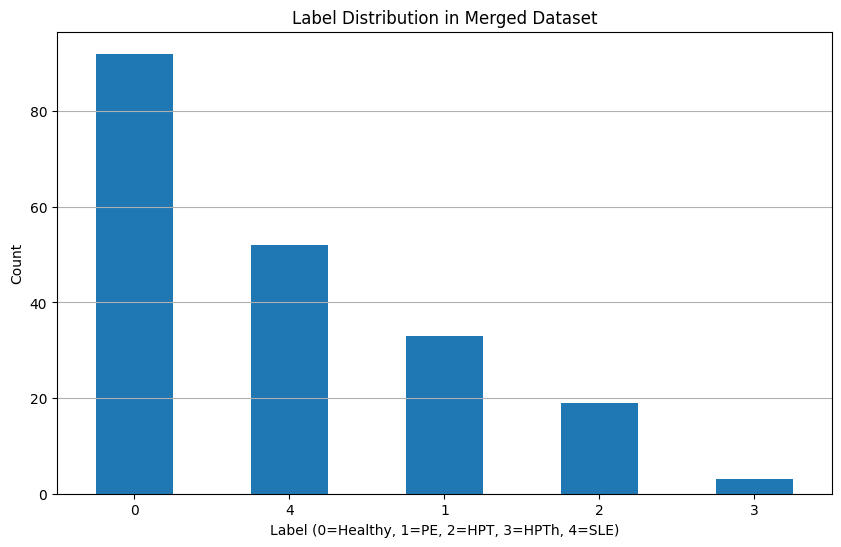

In [28]:
# Plot the distribution of labels with bar plot
plt.figure(figsize=(10, 6))
merged_data['label'].value_counts().plot(kind='bar')
plt.title('Label Distribution in Merged Dataset')
plt.xlabel('Label (0=Healthy, 1=PE, 2=HPT, 3=HPTh, 4=SLE)')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.show()

In [29]:
merged_data.to_csv("clean_data/final_clean_merged.csv")

### **11. Feature Preparation**
Description: Prepare features for model training:
1. **Data Split**:
   - Separate features (X) and labels (y)
   - Verify split dimensions
2. **Feature Scaling**:
   - Apply StandardScaler
   - Transform to normal distribution
3. **Quality Check**:
   - Confirm scaling results
   - Verify data structure

In [30]:
# Split the merged dataset into features and labels
X = merged_data.drop(columns=['label'])
y = merged_data['label']
print("Features shape:", X.shape)
print("Labels shape:", y.shape)

Features shape: (199, 9)
Labels shape: (199,)


In [31]:
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Scaled features shape:", X_scaled.shape)

Scaled features shape: (199, 9)


### **12. Class Imbalance Handling**
Description: Address class imbalance using SMOTE:
1. **SMOTE Application**:
   - Set random_state for reproducibility
   - Define k_neighbors parameter
2. **Resampling Process**:
   - Generate synthetic samples
   - Balance class distribution
3. **Verification**:
   - Plot new class distribution
   - Confirm balanced classes

Resampled features shape: (460, 9)
Resampled labels shape: (460,)


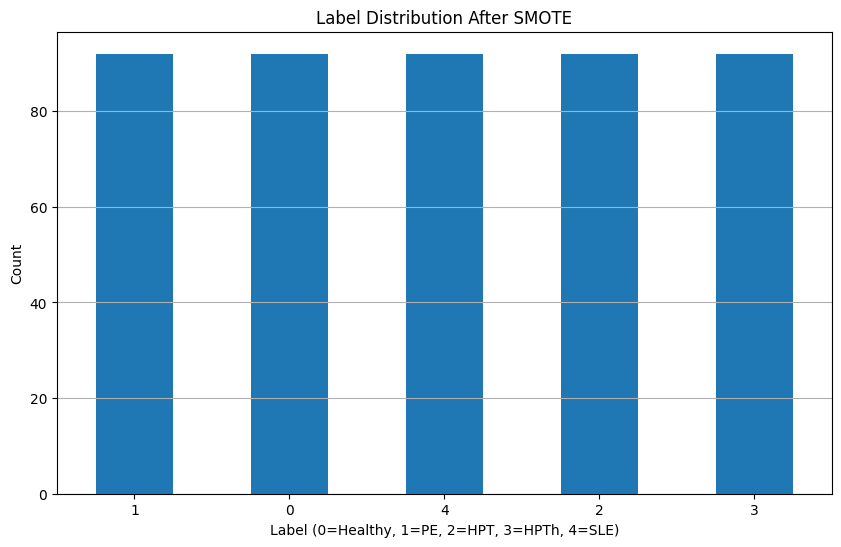

In [32]:
# Upsample the minority class using SMOTE
smote = SMOTE(random_state=42, k_neighbors=2)
X, y = smote.fit_resample(X_scaled, y)
print("Resampled features shape:", X.shape)
print("Resampled labels shape:", y.shape)

# Check the distribution of labels after SMOTE
plt.figure(figsize=(10, 6))
y.value_counts().plot(kind='bar')
plt.title('Label Distribution After SMOTE')
plt.xlabel('Label (0=Healthy, 1=PE, 2=HPT, 3=HPTh, 4=SLE)')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.show()

In [33]:
# Make a dataframe from the scaled features
X = pd.DataFrame(X, columns=merged_data.columns[:-1])

### **13. Lasso Feature Selection**
Description: Implement Lasso regression for feature selection:
1. Train LassoCV model with cross-validation to find optimal alpha
2. Use coefficient magnitudes to rank feature importance
3. Select features with absolute coefficients > 0.2
4. Create DataFrame of selected features and their importance scores

Key Parameters:
- **alphas**: Range from 10^-4 to 10^4
- **cv**: 10-fold cross-validation
- **Threshold**: 0.2 for feature selection

In [34]:
# Train Lasso model and perform feature selection s
lasso = LassoCV(alphas=np.logspace(-4, 4, 100), cv=10, random_state=42)
lasso.fit(X, y)
importance = np.abs(lasso.coef_)
# Create a DataFrame for feature importance
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
# Sort the features by importance
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)
feature_importance.reset_index(drop=True, inplace=True)
lasso_feature_importance = feature_importance[feature_importance['Importance'] > 0.2]
# Print the selected features
print("Number of Biomarkers selected by Lasso:", len(lasso_feature_importance))
print("Selected Biomarkers using Lasso:")
print(lasso_feature_importance)

Number of Biomarkers selected by Lasso: 5
Selected Biomarkers using Lasso:
  Feature  Importance
0   PTPRC    1.514172
1    AKT1    0.783960
2    TFRC    0.452679
3     INS    0.390093
4     TNF    0.346337


### **14. Random Forest Feature Selection**
Description: Use Random Forest for feature importance ranking:
1. Train RandomForestClassifier with 500 trees
2. Extract feature importance scores based on Gini importance
3. Select features with importance > 0.05
4. Sort and display selected features with their scores

Key Parameters:
- **n_estimators**: 500 trees
- **Threshold**: 0.05 for feature selection

In [35]:
# Train Random Forest model and perform feature selection
rf = RandomForestClassifier(n_estimators=500, random_state=42)
rf.fit(X, y)
importance = rf.feature_importances_
# Create a DataFrame for feature importance
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
# Sort the features by importance
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)
feature_importance.reset_index(drop=True, inplace=True)
rf_feature_importance = feature_importance[feature_importance['Importance'] > 0.05]
# Print the selected features
print("Number of Biomarkers selected by Random Forest:", len(rf_feature_importance))
print("Selected Biomarkers using Random Forest:")
print(rf_feature_importance)

Number of Biomarkers selected by Random Forest: 7
Selected Biomarkers using Random Forest:
  Feature  Importance
0    CD36    0.224509
1    AKT1    0.192901
2   PTPRC    0.184528
3    CD44    0.105564
4    TFRC    0.087770
5     IL6    0.080615
6    ACTB    0.076142


### **15. SVM-RFE Feature Selection**
Description: Apply Support Vector Machine Recursive Feature Elimination:
1. Use linear SVM as base estimator
2. Iteratively eliminate features based on their weights
3. Select top 10 most important features
4. Create ranking of all features

Key Parameters:
- **kernel**: Linear
- **n_features_to_select**: 10 features

In [36]:
# Train SVM-RFE model and perform feature selection
svm = SVC(kernel='linear', random_state=42)
rfe = RFE(estimator=svm, n_features_to_select=10)
rfe.fit(X, y)
# Create a DataFrame for feature importance
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': rfe.ranking_})
# Sort the features by importance
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)
feature_importance.reset_index(drop=True, inplace=True)
svmrfe_feature_importance = feature_importance[feature_importance['Importance'] > 0.0]
# Print the selected features
print("Number of Biomarkers selected by SVM-RFE:", len(svmrfe_feature_importance))
print("Selected Biomarkers using SVM-RFE:")
print(svmrfe_feature_importance)

Number of Biomarkers selected by SVM-RFE: 9
Selected Biomarkers using SVM-RFE:
  Feature  Importance
0    ACTB           1
1    AKT1           1
2    CD36           1
3    CD44           1
4     IL6           1
5     INS           1
6   PTPRC           1
7    TFRC           1
8     TNF           1


/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/feature_selection/_rfe.py:300: UserWarning: Found n_features_to_select=10 > n_features=9. There will be no feature selection and all features will be kept.
  warnings.warn(


### **16. Intersection of Selected Features**
Description: Identify consensus features across methods:
1. Extract features selected by each method (Lasso, RF, SVM-RFE)
2. Find intersection using set operations
3. Create final list of biomarkers present in all three methods
4. Sort and display common features

In [37]:
# Intersection of selected features from all three methods
lasso_features = set(lasso_feature_importance['Feature'])
rf_features = set(rf_feature_importance['Feature'])
svmrfe_features = set(svmrfe_feature_importance['Feature'])
intersection_features = lasso_features.intersection(rf_features).intersection(svmrfe_features)
# Print the intersection of selected features
print("Number of Biomarkers in intersection:", len(list(intersection_features)))
print("Intersection of Selected Biomarkers:")
print(list(sorted(intersection_features)))

Number of Biomarkers in intersection: 3
Intersection of Selected Biomarkers:
['AKT1', 'PTPRC', 'TFRC']


In [38]:
# Create a new DataFrame with the selected features with scores from all three methods
# Create a list to store rows
rows = []
for feature in intersection_features:
    lasso_score = lasso_feature_importance[lasso_feature_importance['Feature'] == feature]['Importance'].values[0]
    rf_score = rf_feature_importance[rf_feature_importance['Feature'] == feature]['Importance'].values[0]
    svmrfe_score = svmrfe_feature_importance[svmrfe_feature_importance['Feature'] == feature]['Importance'].values[0]
    rows.append({
        'Feature': feature,
        'Lasso': lasso_score,
        'Random Forest': rf_score,
        'SVM-RFE': svmrfe_score
    })

selected_features = pd.DataFrame(rows)
# Print the selected features with scores
print("Selected Biomarkers with Scores:")
print(selected_features)
# Save to CSV
selected_features.to_csv('results/pe_sle_hpt_hpth_multimode_selected_features.csv', index=False)

Selected Biomarkers with Scores:
  Feature     Lasso  Random Forest  SVM-RFE
0    AKT1  0.783960       0.192901        1
1   PTPRC  1.514172       0.184528        1
2    TFRC  0.452679       0.087770        1


In [39]:
X = X[list(sorted(intersection_features))]
X.head()

,AKT1,PTPRC,TFRC
0,-0.476914,-0.549864,4.021965
1,-0.299450,-0.548423,1.498701
2,-0.476914,-0.550585,1.506564
3,-0.211503,-0.550044,0.686445
4,0.168553,-0.551485,0.432074


### **17. Machine Learning Model Training**
Description: Train and evaluate multiple classification models:
1. Split data into training (90%) and testing (10%) sets
2. Train seven different models:
   - Logistic Regression
   - Support Vector Machine
   - K-Nearest Neighbors
   - Random Forest
   - Gradient Boosting
   - XGBoost
   - LightGBM
3. Calculate performance metrics:
   - Accuracy
   - Precision
   - Recall
   - F1-score
   - ROC AUC

In [40]:
# Split the resampled dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
print("Training features shape:", X_train.shape)
print("Training labels shape:", y_train.shape)
print("Testing features shape:", X_test.shape)
print("Testing labels shape:", y_test.shape)

Training features shape: (414, 3)
Training labels shape: (414,)
Testing features shape: (46, 3)
Testing labels shape: (46,)


In [41]:
# Define a dictionary of models to train
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'LightGBM': LGBMClassifier(verbose=-1)
}

results = []  # List to store performance metrics for each model

# Train each model and evaluate its performance
for name, model in tqdm(models.items(), desc="Training & Evaluating models"):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro', zero_division=0)
    recall = recall_score(y_test, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='macro', zero_division=0)
    
    # Calculate ROC AUC using predict_proba if available
    if hasattr(model, "predict_proba"):
        y_proba_full = model.predict_proba(X_test)
        n_classes = len(np.unique(y_test))
        if n_classes == 2:
            # For binary classification, use the positive class probabilities
            y_proba = y_proba_full[:, 1]
            roc_auc = roc_auc_score(y_test, y_proba)
        else:
            # For multiclass, pass the full probability array with multi_class option
            roc_auc = roc_auc_score(y_test, y_proba_full, multi_class='ovr')
    else:
        roc_auc = np.nan

    # Print performance metrics
    print(f"Model: {name}")
    print(f"  Accuracy : {accuracy:.4f}")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall   : {recall:.4f}")
    print(f"  F1 Score : {f1:.4f}")
    if not np.isnan(roc_auc):
        print(f"  ROC AUC  : {roc_auc:.4f}")
    else:
        print("  ROC AUC  : Not available")
    print("-" * 40)

    # Append results to list
    results.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC AUC': roc_auc
    })


Training & Evaluating models:   0%|          | 0/7 [00:00<?, ?it/s]

Model: Logistic Regression
  Accuracy : 0.7609
  Precision: 0.7394
  Recall   : 0.7754
  F1 Score : 0.7456
  ROC AUC  : 0.9299
----------------------------------------
Model: SVM
  Accuracy : 0.7826
  Precision: 0.7724
  Recall   : 0.8154
  F1 Score : 0.7762
  ROC AUC  : 0.9738
----------------------------------------
Model: KNN
  Accuracy : 0.9348
  Precision: 0.9253
  Recall   : 0.9365
  F1 Score : 0.9301
  ROC AUC  : 0.9792
----------------------------------------
Model: Random Forest
  Accuracy : 0.9130
  Precision: 0.8978
  Recall   : 0.9247
  F1 Score : 0.9087
  ROC AUC  : 0.9903
----------------------------------------
Model: Gradient Boosting
  Accuracy : 0.9348
  Precision: 0.9475
  Recall   : 0.9365
  F1 Score : 0.9374
  ROC AUC  : 0.9894
----------------------------------------
Model: XGBoost
  Accuracy : 0.9348
  Precision: 0.9475
  Recall   : 0.9365
  F1 Score : 0.9374
  ROC AUC  : 0.9872
----------------------------------------


/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [21:25:42] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Model: LightGBM
  Accuracy : 0.9348
  Precision: 0.9475
  Recall   : 0.9365
  F1 Score : 0.9374
  ROC AUC  : 0.9883
----------------------------------------


In [42]:
# Store the results in a dataframe and print
results_df = pd.DataFrame(results)
print("Summary of model performance:")
print(results_df)

# Save the model results
results_df.to_csv('performances/pe_sle_hpt_hpth_base_predictive_model_performance.csv', index=False)
print("Performance for Base Model Saved")

Summary of model performance:
                 Model  Accuracy  Precision    Recall  F1 Score   ROC AUC
0  Logistic Regression  0.760870   0.739365  0.775425  0.745611  0.929938
1                  SVM  0.782609   0.772374  0.815425  0.776178  0.973756
2                  KNN  0.934783   0.925278  0.936471  0.930053  0.979169
3        Random Forest  0.913043   0.897778  0.924706  0.908690  0.990331
4    Gradient Boosting  0.934783   0.947500  0.936471  0.937374  0.989355
5              XGBoost  0.934783   0.947500  0.936471  0.937374  0.987163
6             LightGBM  0.934783   0.947500  0.936471  0.937374  0.988346
Performance for Base Model Saved


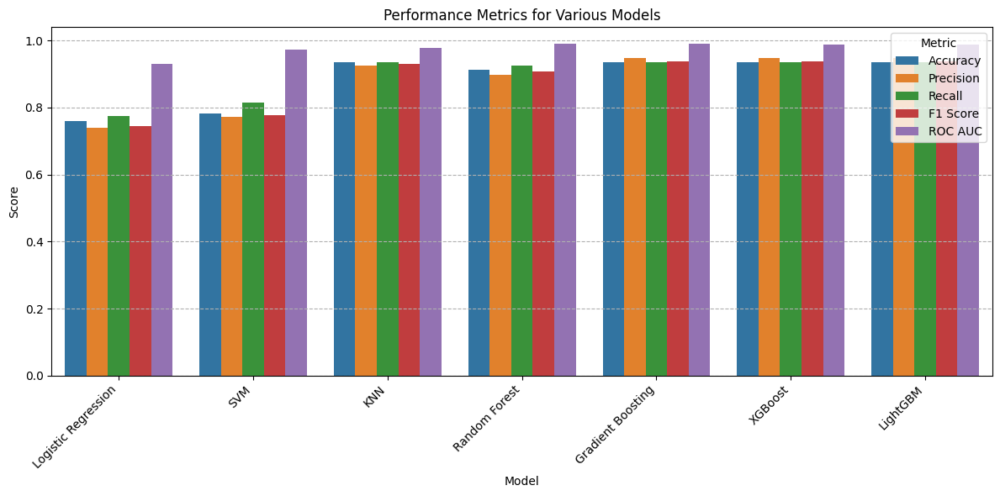

In [43]:
# Plot the performance metrics
# Melt the results_df so that each row represents a metric score for a given model
results_melted = results_df.melt(id_vars='Model', var_name='Metric', value_name='Score')

plt.figure(figsize=(12, 6))
sns.barplot(data=results_melted, x='Model', y='Score', hue='Metric')
plt.title("Performance Metrics for Various Models")
plt.ylabel("Score")
plt.xticks(rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--')
plt.tight_layout()

# Save the figure
plt.savefig('figures/pe_sle_hpt_hpth_base_predictive_model_performance.png')
# Show the plot
plt.show()

### **18. Hyperparameter Tuning**
Description: Optimize model performance through grid search:
1. Define parameter grids for each model
2. Perform GridSearchCV with 5-fold cross-validation
3. Save best models and their parameters
4. Compare performance before and after tuning
5. Export optimized models for future use

In [44]:
# Hyperparameter tuning for all models for multiclass classification

# Define the hyperparameter grid for each model
param_grids = {
    'Logistic Regression': {
        'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
        'penalty': ['l1', 'l2', 'elasticnet'],
        'solver': ['lbfgs', 'saga'],
        'l1_ratio': [0, 0.5, 1]  # Only used when penalty='elasticnet'
    },
    'SVM': {
        'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
        'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
        'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1],  # Important for RBF, poly, sigmoid
        'degree': [2, 3, 4, 5]  # Only for 'poly' kernel
    },
    'KNN': {
        'n_neighbors': list(range(1, 31, 2)),  # More choices: 1,3,5,...29
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan', 'minkowski'],
        'p': [1, 2]  # p=1 for manhattan, p=2 for euclidean (only relevant for minkowski)
    },
    'Random Forest': {
        'n_estimators': [100, 200, 300, 500],
        'max_depth': [None, 10, 20, 30, 50],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['auto', 'sqrt', 'log2'],
        'bootstrap': [True, False]
    },
    'Gradient Boosting': {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'subsample': [0.8, 1.0],
        'max_features': ['auto', 'sqrt', 'log2']
    },
    'XGBoost': {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_child_weight': [1, 3, 5],
        'gamma': [0, 0.1, 0.3],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'reg_alpha': [0, 0.1, 0.5],
        'reg_lambda': [1, 1.5, 2]
    },
    'LightGBM': {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.05, 0.1],
        'num_leaves': [31, 63, 127],
        'max_depth': [-1, 10, 20, 30],
        'min_child_samples': [5, 10, 20],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0],
        'reg_alpha': [0, 0.1, 0.5],
        'reg_lambda': [0, 0.1, 0.5]
    }
}

# Initialize a dictionary to store the best models and their scores
best_models = {}

# Iterate through each model and perform hyperparameter tuning
for name, model in tqdm(models.items(), desc="Hyperparameters Tuning"):
    print(f"Tuning hyperparameters for {name}...")
    param_grid = param_grids[name]
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='f1_macro', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Get the best model and its score
    best_model = grid_search.best_estimator_
    best_score = grid_search.best_score_
    
    # Store the best model and its score
    best_models[name] = {
        'model': best_model,
        'score': best_score
    }
    
    print(f"Best parameters for {name}: {grid_search.best_params_}")
    print(f"Best F1 Score (macro) for {name}: {best_score:.4f}")
    joblib.dump(best_model, f"models/best_{name}.pkl")
    print("-" * 40)

# Print the best models and their scores
print("\n\nBest models and their scores:")
for name, info in best_models.items():
    print(f"{name}: Best F1 Score (macro) = {info['score']:.4f}")
    print(f"Best Parameters: {info['model'].get_params()}")
    print("-" * 40)

Hyperparameters Tuning:   0%|          | 0/7 [00:00<?, ?it/s]

Tuning hyperparameters for Logistic Regression...


/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when pena

Best parameters for Logistic Regression: {'C': 100, 'l1_ratio': 0, 'penalty': 'l2', 'solver': 'lbfgs'}
Best F1 Score (macro) for Logistic Regression: 0.7440
----------------------------------------
Tuning hyperparameters for SVM...
Best parameters for SVM: {'C': 100, 'degree': 2, 'gamma': 0.1, 'kernel': 'rbf'}
Best F1 Score (macro) for SVM: 0.8367
----------------------------------------
Tuning hyperparameters for KNN...
Best parameters for KNN: {'metric': 'manhattan', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best F1 Score (macro) for KNN: 0.8626
----------------------------------------
Tuning hyperparameters for Random Forest...


/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
1800 fits failed out of a total of 5400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
569 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/base.py", line 436, in _validate_params
    va

Best parameters for Random Forest: {'bootstrap': True, 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
Best F1 Score (macro) for Random Forest: 0.8944
----------------------------------------
Tuning hyperparameters for Gradient Boosting...


/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
3240 fits failed out of a total of 9720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2326 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/sklearn/base.py", line 436, in _validate_params
    v

Best parameters for Gradient Boosting: {'learning_rate': 0.01, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100, 'subsample': 0.8}
Best F1 Score (macro) for Gradient Boosting: 0.8894
----------------------------------------
Tuning hyperparameters for XGBoost...


/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [22:34:08] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [22:34:08] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [22:34:08] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [22:34:08] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/

Best parameters for XGBoost: {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'reg_alpha': 0, 'reg_lambda': 1.5, 'subsample': 1.0}
Best F1 Score (macro) for XGBoost: 0.8783
----------------------------------------
Tuning hyperparameters for LightGBM...
Best parameters for LightGBM: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': -1, 'min_child_samples': 5, 'n_estimators': 300, 'num_leaves': 31, 'reg_alpha': 0.5, 'reg_lambda': 0.1, 'subsample': 0.8}
Best F1 Score (macro) for LightGBM: 0.8749
----------------------------------------


Best models and their scores:
Logistic Regression: Best F1 Score (macro) = 0.7440
Best Parameters: {'C': 100, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': 0, 'max_iter': 1000, 'multi_class': 'deprecated', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': Fa

In [45]:
# Evaluate the best model on the test set and store the results in a dataframe
best_model_results = []
for name, model in tqdm(best_models.items(), desc="Training & Evaluating models"):
    model = info['model']
    y_pred = model.predict(X_test)
    
    # Calculate performance metrics using macro-average for multiclass classification
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro', zero_division=0)
    recall = recall_score(y_test, y_pred, average='macro', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='macro', zero_division=0)
    
    # Calculate ROC AUC using predict_proba if available
    if hasattr(model, "predict_proba"):
        y_proba_full = model.predict_proba(X_test)
        n_classes = len(np.unique(y_test))
        if n_classes == 2:
            y_proba = y_proba_full[:, 1]
            roc_auc = roc_auc_score(y_test, y_proba)
        else:
            roc_auc = roc_auc_score(y_test, y_proba_full, multi_class='ovr')
    else:
        roc_auc = np.nan

    # Calculate ROC AUC using predict_proba if available
    if hasattr(model, "predict_proba"):
        y_proba_full = model.predict_proba(X_test)
        n_classes = len(np.unique(y_test))
        if n_classes == 2:
            # For binary classification, use the positive class probabilities
            y_proba = y_proba_full[:, 1]
            roc_auc = roc_auc_score(y_test, y_proba)
        else:
            # For multiclass, pass the full probability array with multi_class option
            roc_auc = roc_auc_score(y_test, y_proba_full, multi_class='ovr')
    else:
        roc_auc = np.nan

    # Append results to list
    best_model_results.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC AUC': roc_auc
    })


Training & Evaluating models:   0%|          | 0/7 [00:00<?, ?it/s]

In [46]:
# Store the results in a dataframe and print
best_model_results_df = pd.DataFrame(best_model_results)
print("Summary of best model performance:")
print(best_model_results_df)

# Save the best model results
best_model_results_df.to_csv('performances/pe_sle_hpt_hpth_hyperparameter_tuned_predictive_model_performance.csv', index=False)
print("Performance for Tuned model Saved.")

Summary of best model performance:
                 Model  Accuracy  Precision    Recall  F1 Score   ROC AUC
0  Logistic Regression  0.913043   0.906667  0.924706  0.912778  0.982767
1                  SVM  0.913043   0.906667  0.924706  0.912778  0.982767
2                  KNN  0.913043   0.906667  0.924706  0.912778  0.982767
3        Random Forest  0.913043   0.906667  0.924706  0.912778  0.982767
4    Gradient Boosting  0.913043   0.906667  0.924706  0.912778  0.982767
5              XGBoost  0.913043   0.906667  0.924706  0.912778  0.982767
6             LightGBM  0.913043   0.906667  0.924706  0.912778  0.982767
Performance for Tuned model Saved.


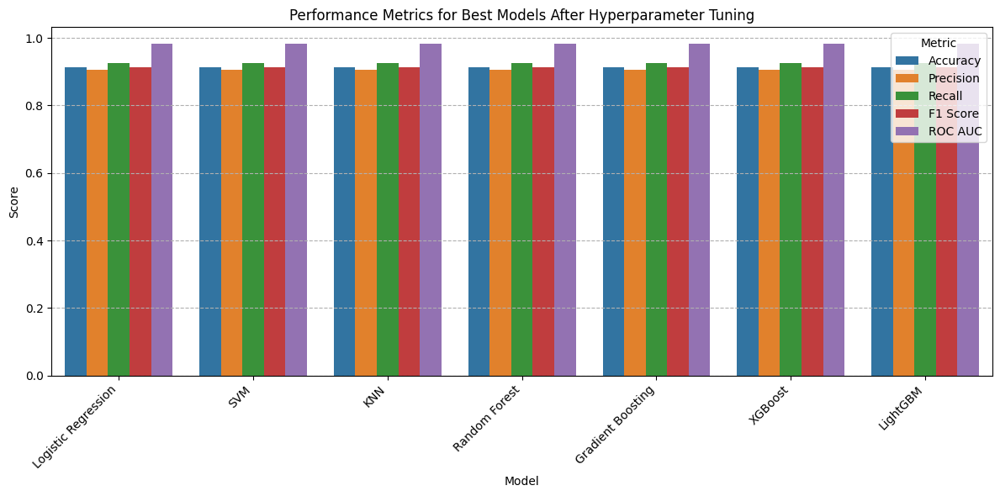

In [47]:
# Plot the best models and their scores after hyperparameter tuning
plt.figure(figsize=(12, 6))
best_model_results_melted = best_model_results_df.melt(id_vars='Model', var_name='Metric', value_name='Score')
sns.barplot(data=best_model_results_melted, x='Model', y='Score', hue='Metric')
plt.title("Performance Metrics for Best Models After Hyperparameter Tuning")
plt.ylabel("Score")
plt.xticks(rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--')
plt.tight_layout()

# Save the figure
plt.savefig('figures/pe_sle_hpt_hpth_hyperparameter_tuned_predictive_model_performance.png')
# Show the plot
plt.show()

### **19. Stacking Classifier**
Description: Create ensemble model using stacking:
1. Select five best-performing base models
2. Use LogisticRegression as meta-classifier
3. Train stacked model with 5-fold cross-validation
4. Evaluate final model performance
5. Save stacked model for deployment

Base Models:
- Gradient Boosting
- SVM
- Random Forest
- XGBoost
- LightGBM

In [48]:
# Create a Stacking Classifier with the 5 best models
base_models = [
    ('Gradient Boosting', best_models['Gradient Boosting']['model']),
    ('SVM', best_models['SVM']['model']),
    ('Random Forest', best_models['Random Forest']['model']),
    ('XGBoost', best_models['XGBoost']['model']),
    ('LightGBM', best_models['LightGBM']['model'])
]

stacking_model = StackingClassifier(
    estimators=base_models,
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

# Train the stacking model
stacking_model.fit(X_train, y_train)

# Evaluate the stacking model on the test set
y_pred_stacking = stacking_model.predict(X_test)

# Calculate performance metrics using macro-average for multiclass classification
accuracy_stacking = accuracy_score(y_test, y_pred_stacking)
precision_stacking = precision_score(y_test, y_pred_stacking, average='macro', zero_division=0)
recall_stacking = recall_score(y_test, y_pred_stacking, average='macro', zero_division=0)
f1_stacking = f1_score(y_test, y_pred_stacking, average='macro', zero_division=0)

# Calculate ROC AUC using predict_proba if available
if hasattr(stacking_model, "predict_proba"):
    y_proba_full = stacking_model.predict_proba(X_test)
    n_classes = len(np.unique(y_test))
    if n_classes == 2:
        # For binary, use the positive class probabilities
        y_proba = y_proba_full[:, 1]
        roc_auc_stacking = roc_auc_score(y_test, y_proba)
    else:
        # For multiclass, use full array and specify multi_class
        roc_auc_stacking = roc_auc_score(y_test, y_proba_full, multi_class='ovr')
else:
    roc_auc_stacking = np.nan

# Print performance metrics for the stacking model
print(f"Stacking Model:")
print(f"  Accuracy : {accuracy_stacking:.4f}")
print(f"  Precision: {precision_stacking:.4f}")
print(f"  Recall   : {recall_stacking:.4f}")
print(f"  F1 Score : {f1_stacking:.4f}")
if not np.isnan(roc_auc_stacking):
    print(f"  ROC AUC  : {roc_auc_stacking:.4f}")
else:
    print("  ROC AUC  : Not available")
print("-" * 40)

# Save the stacking model
joblib.dump(stacking_model, 'models/pe_sle_hpt_hpth_stacking_model.pkl')

/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [12:23:49] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [12:23:53] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [12:23:53] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/anaconda3/envs/dsenv/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [12:23:53] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/home/sajid/

Stacking Model:
  Accuracy : 0.9348
  Precision: 0.9475
  Recall   : 0.9365
  F1 Score : 0.9374
  ROC AUC  : 0.9820
----------------------------------------


['models/pe_sle_hpt_hpth_stacking_model.pkl']